In [16]:
import xarray as xr
from datetime import date
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from pyproj import Transformer, CRS
# import time
import glob
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.path as mpath
import cmocean.cm as cmo
import matplotlib.cm as cm
from matplotlib.colors import TwoSlopeNorm

In [17]:
#define filepaths

outfp = '/data/users/janheuser/images/'
deffp = '/home/janheuser/projects/def/release_1/'


In [18]:
#load observational estimates from Anheuser et al. (2022) and apply region mask

alltime=xr.open_mfdataset(deffp + 'thmdyn2*')

ease=xr.open_dataset(deffp + 'EASE2_N25km.geolocation.v0.9.nc')
ease['y']=-ease.y
ease = ease.sel(x=slice(-4e6,4e6),y=slice(-4e6,4e6))

rmask=xr.open_dataset(deffp + 'sio_mask.nc')

transformer = Transformer.from_crs(4326, 6931)
rx, ry = transformer.transform(rmask.lat.values, rmask.lon.values)

rmask_ease=griddata((ry.flatten(),rx.flatten()),rmask.mask.values.flatten(),(ease.y.values[:,None],ease.x.values[None:]), method='nearest')
rmask_ease=xr.DataArray(rmask_ease,coords=[alltime.y, alltime.x],dims=['y','x'])

alltime['rmask']=rmask_ease

alltime=alltime.where((alltime.rmask>=6) & (alltime.rmask<=15))

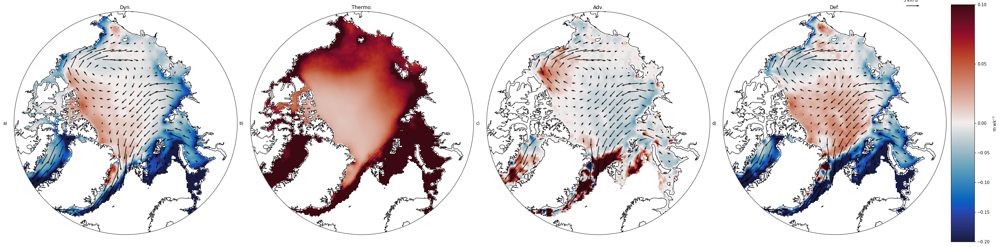

In [4]:
#Figure 1

plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 4, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(10)
f.set_figwidth(32)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Dyn.')

c=ax[0].pcolormesh(alltime.y, alltime.x, alltime.dyn.mean('time'),norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1),cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')


ax[3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[3].set_boundary(circle, transform=ax[3].transAxes)
ax[3].coastlines()
ax[3].set_title('Def.')

d=ax[3].pcolormesh(alltime.y, alltime.x,  alltime.dfm.mean('time').where(alltime.rmask!=14),norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1),cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[3].text(-0.04, 0.5, "d)", transform=ax[3].transAxes, va='center', ha='center')


ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)
ax[2].coastlines()
ax[2].set_title('Adv.')

d=ax[2].pcolormesh(alltime.y, alltime.x,  alltime.adv.mean('time').where(alltime.rmask!=14),norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1),cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[2].text(-0.04, 0.5, "c)", transform=ax[2].transAxes, va='center', ha='center')


ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Thermo.')

d=ax[1].pcolormesh(alltime.y, alltime.x, alltime.thm.mean('time'),norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1),cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')


for i in [0,2,3]:

    Q=ax[i].quiver(alltime.x.values[::8], alltime.y.values[::8], alltime.u.mean('time').where(alltime.u.mean('time')!=0).values[::8,::8], alltime.v.mean('time').where(alltime.v.mean('time')!=0).values[::8,::8],scale=100)

ax[0].quiverkey(Q, 0.85, 1.025, 5.97, '5 km d$^{-1}$')
    
f.tight_layout()

cbar_ax = f.add_axes([1, 0.1, 0.025, 0.8])
cb=f.colorbar(c, cax=cbar_ax, label='m wk$^{-1}$', ticks=[-0.2, -0.15, -0.1, -0.05, 0, 0.05, 0.1])
    
plt.savefig(outfp + 'def_mean.png', bbox_inches="tight")


In [5]:
#calculate area statistics for results section

print('% area of positive dyn: ' + str((alltime.dyn.mean('time')>0).sum().values/np.isfinite(alltime.dyn.mean('time')).sum().values))
print('% area of positive thm: ' + str((alltime.thm.mean('time')>0).sum().values/np.isfinite(alltime.thm.mean('time')).sum().values))
print('% area of positive adv: ' + str((alltime.adv.mean('time')>0).sum().values/np.isfinite(alltime.adv.mean('time')).sum().values))
print('% area of positive def: ' + str((alltime.dfm.mean('time')>0).sum().values/np.isfinite(alltime.dfm.mean('time')).sum().values))

% area of positive dyn: 0.2855181880576527
% area of positive thm: 1.0
% area of positive adv: 0.3392539964476021
% area of positive def: 0.38467988261364316


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


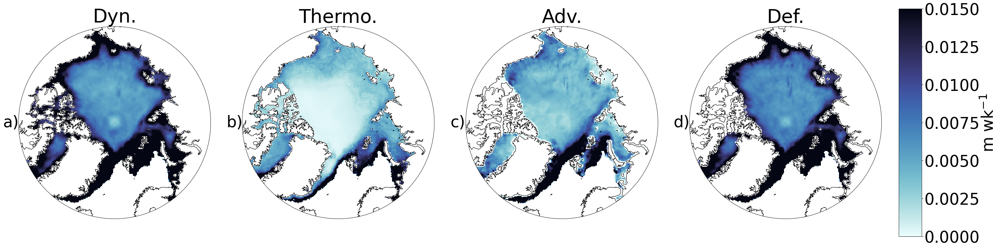

In [6]:
#Figure 2

plt.rcParams['font.size']=40

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 4, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(10)
f.set_figwidth(32)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Dyn.')

d=ax[0].pcolormesh(alltime.y, alltime.x, alltime.dyn.std('time')/np.sqrt(np.isfinite(alltime.dyn).sum('time')),cmap=cmo.ice_r,vmin=0,vmax=0.015,transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')


ax[3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[3].set_boundary(circle, transform=ax[3].transAxes)
ax[3].coastlines()
ax[3].set_title('Def.')

d=ax[3].pcolormesh(alltime.y, alltime.x,  alltime.dfm.std('time').where(alltime.rmask!=14)/np.sqrt(np.isfinite(alltime.dfm).sum('time')),cmap=cmo.ice_r,vmin=0,vmax=0.015,transform=ccrs.epsg(6931))
ax[3].text(-0.04, 0.5, "d)", transform=ax[3].transAxes, va='center', ha='center')


ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)
ax[2].coastlines()
ax[2].set_title('Adv.')

d=ax[2].pcolormesh(alltime.y, alltime.x,  alltime.adv.std('time').where(alltime.rmask!=14)/np.sqrt(np.isfinite(alltime.adv).sum('time')),cmap=cmo.ice_r,vmin=0,vmax=0.015,transform=ccrs.epsg(6931))
ax[2].text(-0.04, 0.5, "c)", transform=ax[2].transAxes, va='center', ha='center')


ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Thermo.')

d=ax[1].pcolormesh(alltime.y, alltime.x, (alltime.thm.std('time')/np.sqrt(np.isfinite(alltime.thm).sum('time'))),cmap=cmo.ice_r,vmin=0,vmax=0.015,transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')
    
f.tight_layout()

cbar_ax = f.add_axes([1, 0.1, 0.025, 0.8])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$')
    
plt.savefig(outfp + 'def_unc.png', bbox_inches="tight")

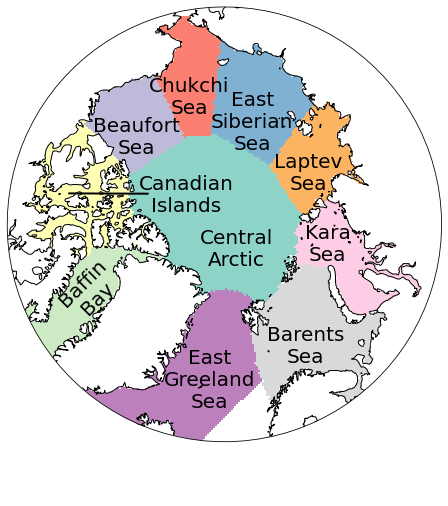

In [7]:
#Figure 3

yi, xi = np.meshgrid(alltime.y.values,alltime.x.values)

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1,1, subplot_kw={'projection': proj})

f.set_figheight(8)
f.set_figwidth(8)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()
d=ax.pcolormesh(alltime.y, alltime.x, alltime.rmask,cmap=cm.Set3_r,transform=ccrs.epsg(6931),vmin=5)

labels=[s.replace(" ", "\n") for s in rmask.region_names[5:15].values.astype(str)]

pos=np.array([[-1038167, -408821],
    [-200000, -1608821],
    [1048321, -1308821],
    [1334065, 10000],
    [1080342, 931916],
    [355079, 1733059],
    [-459426, 1908823],
    [-1138167, 1385255],
    [-500000, 650000],
    [150000, -50000]])

for i in range(5,15):
    if i == 5:
        ax.text(pos[i-5,0],pos[i-5,1],labels[i-5], transform=ccrs.epsg(6931), va='top', ha='center', fontsize=20, rotation=45)       
    else:
        ax.text(pos[i-5,0],pos[i-5,1],labels[i-5], transform=ccrs.epsg(6931), va='top', ha='center', fontsize=20)

ax.plot([-1000000,-2000000],[400000 ,400000],color='black',transform=ccrs.epsg(6931), lw=2)

plt.savefig(outfp + 'regions.png', bbox_inches="tight")

In [8]:
#Table 1

x=rmask_ease.x.where(rmask_ease==20).stack(z=['y','x']).dropna('z').values.ravel()
y=rmask_ease.y.where(rmask_ease==20).stack(z=['y','x']).dropna('z').values.ravel()

dist=np.zeros((320,320))

for i in range(0,len(rmask_ease.y.values)):
    for j in range(0,len(rmask_ease.x.values)):
        dist[i,j]=np.min(np.sqrt((rmask_ease.y.values[i]-y)**2+(rmask_ease.x.values[j]-x)**2))

alltime['land_dist']=xr.DataArray(dist,dims=['y','x'],coords=[alltime.y,alltime.x])

alltime_nocoast=alltime.where(alltime.land_dist>=200000).mean('time')

regional_nocoast=alltime.where(alltime.land_dist>=200000).mean('time').groupby(alltime.rmask).mean(skipna=True)
regional=alltime.mean('time').groupby(alltime.rmask).mean(skipna=True)

for i in range(5,15):
    print(str(rmask.region_names[i].values)[2:-1] + ' & ' + "{:.3f}".format(regional.cs2.sel(rmask=i+1).values) + ' (' + "{:.3f}".format(regional_nocoast.cs2.sel(rmask=i+1).values) + ')' + ' & ' + 
    "{:.3f}".format(regional.dyn.sel(rmask=i+1).values) + ' (' + "{:.3f}".format(regional_nocoast.dyn.sel(rmask=i+1).values) + ')' + ' & ' + "{:.3f}".format(regional.thm.sel(rmask=i+1).values) + ' (' + "{:.3f}".format(regional_nocoast.thm.sel(rmask=i+1).values) + ')' + ' & ' + "{:.3f}".format(regional.adv.sel(rmask=i+1).values) + ' (' + "{:.3f}".format(regional_nocoast.adv.sel(rmask=i+1).values) + ')' + ' & ' + 
    "{:.3f}".format(regional.dfm.sel(rmask=i+1).values) + ' (' + "{:.3f}".format(regional_nocoast.dfm.sel(rmask=i+1).values) + ') ' + '\\\\')
    
print('Entire Arctic' + ' & ' + "{:.3f}".format(alltime.cs2.mean().values) + ' (' + "{:.3f}".format(alltime_nocoast.cs2.mean().values) + ')' + ' & ' + 
"{:.3f}".format(alltime.dyn.mean().values) + ' (' + "{:.3f}".format(alltime_nocoast.dyn.mean().values) + ')' + ' & ' + "{:.3f}".format(alltime.thm.mean().values) + ' (' + "{:.3f}".format(alltime_nocoast.thm.mean().values) + ')' + ' & ' + "{:.3f}".format(alltime.adv.mean().values) + ' (' + "{:.3f}".format(alltime_nocoast.adv.mean().values) + ')' + ' & ' + 
"{:.3f}".format(alltime.dfm.mean().values) + ' (' + "{:.3f}".format(alltime_nocoast.dfm.mean().values) + ') ' + '\\\\')
    

Baffin Bay        & 0.383 (0.308) & -0.237 (-0.263) & 0.240 (0.264) & 0.010 (0.025) & -0.251 (-0.290) \\
East Greeland Sea & 0.905 (0.863) & -0.121 (-0.145) & 0.140 (0.145) & 0.113 (0.145) & -0.247 (-0.316) \\
Barents Sea       & 0.259 (0.292) & -0.269 (-0.222) & 0.257 (0.234) & 0.013 (0.027) & -0.289 (-0.263) \\
Kara Sea          & 0.664 (0.698) & -0.104 (-0.090) & 0.130 (0.122) & -0.013 (-0.014) & -0.090 (-0.077) \\
Laptev Sea        & 0.992 (1.123) & -0.060 (-0.029) & 0.095 (0.074) & -0.021 (-0.022) & -0.038 (-0.007) \\
East Siberian Sea & 1.192 (1.244) & -0.018 (-0.011) & 0.070 (0.064) & -0.008 (-0.008) & -0.010 (-0.003) \\
Chukchi Sea       & 1.051 (1.132) & -0.024 (-0.008) & 0.086 (0.074) & -0.007 (-0.003) & -0.015 (-0.005) \\
Beaufort Sea      & 1.424 (1.468) & -0.009 (0.000) & 0.061 (0.051) & 0.014 (0.019) & -0.022 (-0.019) \\
Canadian Islands  & 1.452 (nan) & -0.027 (nan) & 0.075 (nan) & -0.001 (nan) & -0.024 (nan) \\
Central Arctic    & 2.105 (2.063) & -0.000 (0.001) & 0.034 

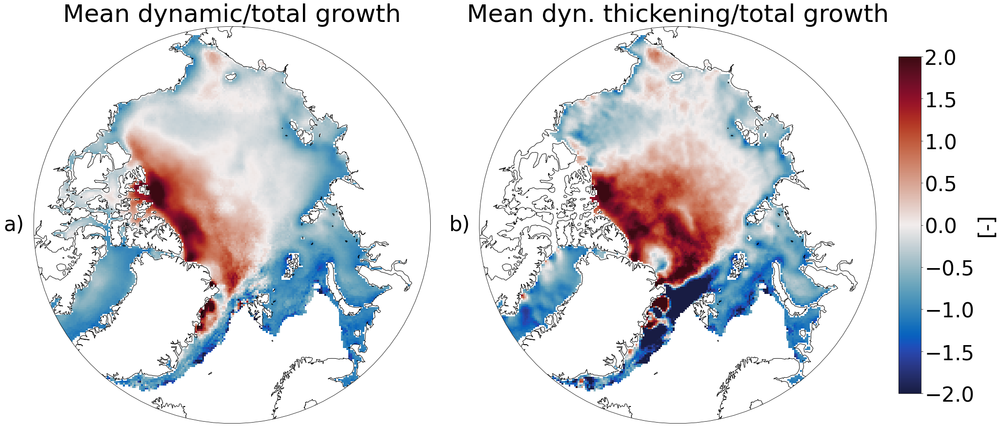

In [9]:
#Figure 4

plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 2, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(16)
f.set_figwidth(26)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes) 
ax[0].coastlines()
ax[0].set_title('Mean dynamic/total growth')

d=ax[0].pcolormesh(alltime.y, alltime.x, alltime.dyn.mean('time')/alltime.thm.mean('time'),transform=ccrs.epsg(6931),cmap=cmo.balance,vmin=-2,vmax=2)
ax[0].text(-0.05, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')


ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Mean dyn. thickening/total growth')

d=ax[1].pcolormesh(alltime.y, alltime.x,  alltime.dfm.mean('time').where(alltime.rmask!=14)/alltime.thm.mean('time'),transform=ccrs.epsg(6931),cmap=cmo.balance,vmin=-2,vmax=2)
ax[1].text(-0.05, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')

f.tight_layout()

cbar_ax = f.add_axes([1, 0.2, 0.025, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='[-]')

plt.savefig(outfp + 'def_rel.png', bbox_inches="tight")

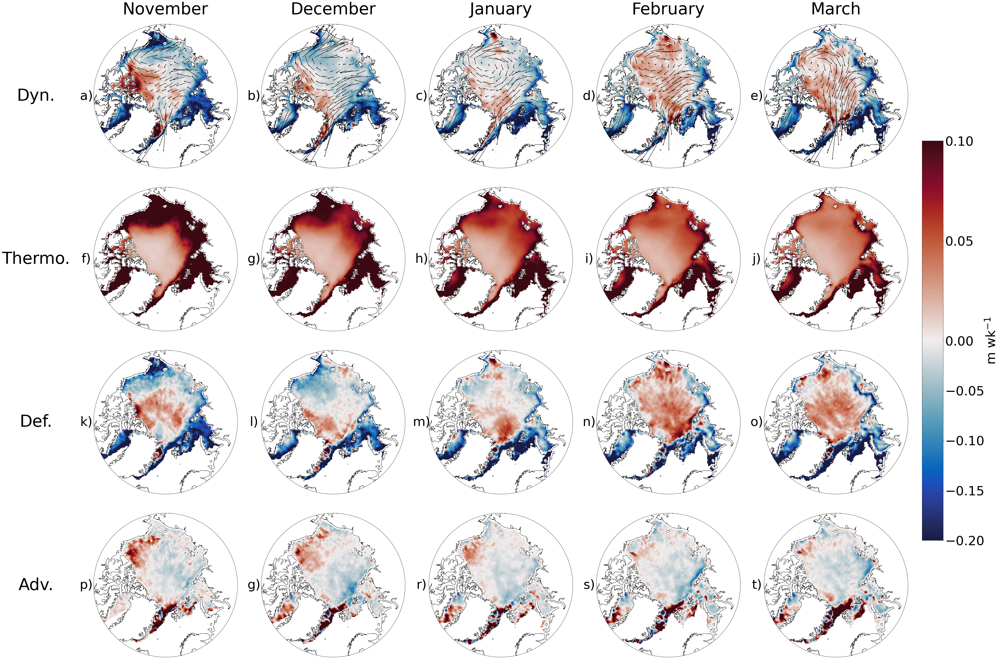

In [10]:
#Figure 5

plt.rcParams['font.size']=50


labels=np.array(['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)','m)','n)','o)','p)','g)','r)','s)','t)']).reshape(4,5)

monthly=alltime.groupby(alltime.time.dt.month).mean()

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(4,5, subplot_kw={'projection': proj})
f.set_figheight(36)
f.set_figwidth(46)

months=[11,12,1,2,3]
monname=['Nov.','Dec.','Jan.','Feb.','Mar.']
for i in range(0,len(months)):
    ax[0,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[0,i].set_boundary(circle, transform=ax[0,i].transAxes)
    ax[0,i].coastlines()
    d=ax[0,i].pcolormesh(monthly.y, monthly.x, monthly.dyn.sel(month=months[i]),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    ax[0,i].text(-0.05, 0.5, labels[0,i], transform=ax[0,i].transAxes, va='center', ha='center')

for i in range(0,len(months)):
    ax[0,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[0,i].set_boundary(circle, transform=ax[0,i].transAxes)
    ax[0,i].coastlines()
    Q=ax[0,i].quiver(monthly.x.values[::10], monthly.y.values[::10], monthly.u.sel(month=months[i]).values[::10,::10], monthly.v.sel(month=months[i]).values[::10,::10], scale=50)

ax[0,0].quiverkey(Q, -5.8, -0.0155, 5.79, '5\nkm d$^{-1}$')

for i in range(0,len(months)):
    ax[1,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[1,i].set_boundary(circle, transform=ax[1,i].transAxes)
    ax[1,i].coastlines()
    d=ax[1,i].pcolormesh(monthly.y, monthly.x, monthly.thm.sel(month=months[i]),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    ax[1,i].text(-0.05, 0.5, labels[1,i], transform=ax[1,i].transAxes, va='center', ha='center')
    
for i in range(0,len(months)):
    ax[2,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[2,i].set_boundary(circle, transform=ax[2,i].transAxes)
    ax[2,i].coastlines()
    d=ax[2,i].pcolormesh(monthly.y, monthly.x, monthly.dfm.sel(month=months[i]).where(alltime.rmask!=14),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    ax[2,i].text(-0.05, 0.5, labels[2,i], transform=ax[2,i].transAxes, va='center', ha='center')

for i in range(0,len(months)):
    ax[3,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[3,i].set_boundary(circle, transform=ax[3,i].transAxes)
    ax[3,i].coastlines()
    d=ax[3,i].pcolormesh(monthly.y, monthly.x, monthly.adv.sel(month=months[i]).where(alltime.rmask!=14),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    ax[3,i].text(-0.05, 0.5, labels[3,i], transform=ax[3,i].transAxes, va='center', ha='center')

f.tight_layout()

cbar_ax = f.add_axes([1, 0.2, 0.025, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$', ticks=[-0.2, -0.15, -0.1, -0.05, 0, 0.05, 0.1])


ax[0,0].text(0.5, 1.1, 'November', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=64)
ax[0,1].text(0.5, 1.1, 'December', transform=ax[0,1].transAxes, va='center', ha='center', fontsize=64)
ax[0,2].text(0.5, 1.1, 'January', transform=ax[0,2].transAxes, va='center', ha='center', fontsize=64)
ax[0,3].text(0.5, 1.1, 'February', transform=ax[0,3].transAxes, va='center', ha='center', fontsize=64)
ax[0,4].text(0.5, 1.1, 'March', transform=ax[0,4].transAxes, va='center', ha='center', fontsize=64)

ax[0,0].text(-0.4, 0.5, 'Dyn.', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=64)
ax[1,0].text(-0.4, 0.5, 'Thermo.', transform=ax[1,0].transAxes, va='center', ha='center', fontsize=64)
ax[2,0].text(-0.4, 0.5, 'Def.', transform=ax[2,0].transAxes, va='center', ha='center', fontsize=64)
ax[3,0].text(-0.4, 0.5, 'Adv.', transform=ax[3,0].transAxes, va='center', ha='center', fontsize=64)

plt.savefig(outfp + 'def_monthly.png', bbox_inches="tight")

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-10-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-10-29T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-05T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-12T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-19T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00
<xarray.DataArray 'time' ()>
array('2019-11-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-11-26T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-03T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-03T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-10T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-10T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-17T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-17T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00
<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2019-12-24T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2019-12-24T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-08T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-08T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2020-01-15T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-15T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-22T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-22T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00
<xarray.DataArray 'time' ()>
array('2020-01-29T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-01-29T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-05T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-05T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-12T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-12T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-19T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-19T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00
<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-02-26T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-02-26T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-04T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-04T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-11T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-11T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-18T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-18T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00
<xarray.DataArray 'time' ()>
array('2020-03-25T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-03-25T12:00:00
<xarray.DataArray 'time' ()>
array('2020-04-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-04-01T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise

<xarray.DataArray 'time' ()>
array('2020-04-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-04-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-04-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-04-01T12:00:00
<xarray.DataArray 'time' ()>
array('2020-04-01T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2020-04-01T12:00:00


/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = self.index.get_loc(
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/xarray/core/indexes.py:234: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will rais

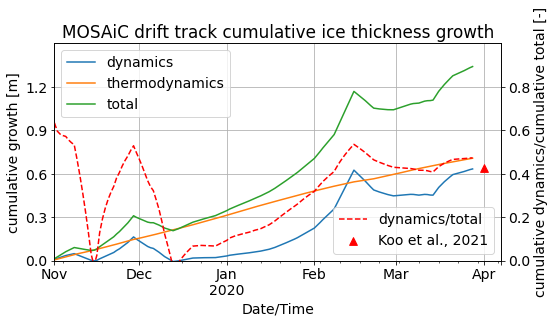

In [12]:
#Figure 6

df=pd.merge_ordered(pd.read_csv(deffp + 'PS122_1_link-to-mastertrack_V2.tab', sep='\t', skiprows=24,parse_dates=True), 
                 pd.read_csv(deffp + 'PS122_2_link-to-mastertrack_V2.tab', sep='\t', skiprows=24,parse_dates=True))
df=pd.merge_ordered(df, pd.read_csv(deffp + 'PS122_3_link-to-mastertrack_V2.tab', sep='\t', skiprows=24))

transformer = Transformer.from_crs(4326, 6931)
x, y = transformer.transform(df.Latitude.values, df.Longitude.values)
df['x']=x
df['y']=y

df['Date/Time']=pd.to_datetime(df['Date/Time'])
df=df.set_index('Date/Time')
df=df.resample('D').mean()
df=df.loc[date(2019,11,1):date(2020,4,1)]

df['dfm']=np.nan
df['thm']=np.nan
df['cs2']=np.nan
df['tsi']=np.nan

for i in range(0,len(df)):
    print(alltime.time.sel(time=df.index[i],method='nearest'))
    df['dfm'].loc[df.index[i]]=alltime.sel(time=df.index[i],x=df.x[i],y=df.y[i],method='nearest').dfm
    df['thm'].loc[df.index[i]]=alltime.sel(time=df.index[i],x=df.x[i],y=df.y[i],method='nearest').thm
    df['cs2'].loc[df.index[i]]=alltime.sel(time=df.index[i],x=df.x[i],y=df.y[i],method='nearest').cs2
    df['tsi'].loc[df.index[i]]=alltime.sel(time=df.index[i],x=df.x[i],y=df.y[i],method='nearest').tsi

plt.rcParams['font.size']=14

    
f, ax = plt.subplots(1,1, figsize=(8,4))
plt.title('MOSAiC drift track cumulative ice thickness growth')
    
(df.dfm/7).cumsum().plot(label='dynamics')
(df.thm/7).cumsum().plot(label='thermodynamics')
(df.thm/7+df.dfm/7).cumsum().plot(label='total')
plt.ylim((-0,1.5))
plt.yticks(np.arange(0, 1.5, step=0.3))
ax.set_ylabel('cumulative growth [m]')
ax.grid()
ax.legend()

ax2=ax.twinx()
((df.dfm/7).cumsum()/(df.thm/7+df.dfm/7).cumsum()).plot(color='r',linestyle='dashed',ax=ax2,label='dynamics/total')
plt.ylim((-0,1))
plt.xlim(date(2019,11,1),date(2020,4,7))
ax2.set_ylabel('cumulative dynamics/cumulative total [-]')
plt.yticks(np.arange(0, 1, step=0.2))
plt.scatter(date(2020,4,1),.426,marker='^',color='red',s=60,label='Koo et al., 2021')
ax2.legend(loc=4)

plt.savefig(outfp + 'mosaic.png', bbox_inches="tight")

In [13]:
print('max. thermodynamic growth: ' + str(np.max(df.thm/7)) + ', min. thermodynamic growth: ' + str(np.min(df.thm/7)))
print('cumulative thermodynamic growth: ' + str((df.thm/7).cumsum()[-5]))
print('max. dynamic effect: ' + str(np.max(df.dfm/7)) + ', min. dynamic effect: ' + str(np.min(df.dfm/7)))
print('cumulative dynamic effect: ' + str((df.dfm/7).cumsum()[-5]))
print('cumulative total change: ' + str((df.dfm/7).cumsum()[-5] + (df.thm/7).cumsum()[-5]))
print('cumulative dynamic effect/cumulative total change: ' + str((df.dfm/7).cumsum()[-5]/(df.thm/7+df.dfm/7).cumsum()[-5]))


max. thermodynamic growth: 0.005903095648372071, min. thermodynamic growth: 0.002977921446497397
cumulative thermodynamic growth: 0.7062596534426696
max. dynamic effect: 0.038674045931156954, min. dynamic effect: -0.020842283979271563
cumulative dynamic effect: 0.6323874354660598
cumulative total change: 1.3386470889087294
cumulative dynamic effect/cumulative total change: 0.4724078815885563


/tmp/ipykernel_285931/3821542808.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  f.tight_layout()


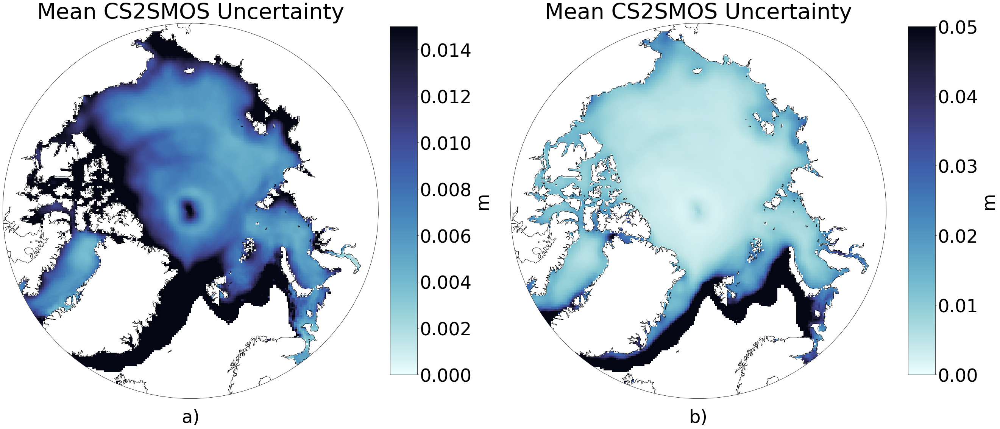

In [14]:
#Figure 7

plt.rcParams['font.size']=48

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 2, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(16)
f.set_figwidth(40)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Mean CS2SMOS Uncertainty')

d=ax[0].pcolormesh(alltime.y, alltime.x, (alltime.cs2_unc.mean('time')/np.sqrt(np.isfinite(alltime.cs2_unc).sum('time'))),cmap=cmo.ice_r,vmin=0,vmax=0.015,transform=ccrs.epsg(6931))    

cbar_ax = f.add_axes([0.45, 0.1, 0.025, 0.8])
cb=f.colorbar(d, cax=cbar_ax, label='m')

ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Mean CS2SMOS Uncertainty')

d=ax[1].pcolormesh(alltime.y, alltime.x, (alltime.cs2_unc.mean('time')/np.sqrt(np.isfinite(alltime.cs2_unc).sum('time')))/alltime.cs2.mean('time'),cmap=cmo.ice_r,vmin=0,vmax=0.05,transform=ccrs.epsg(6931))
    
f.tight_layout()

cbar_ax = f.add_axes([0.925, 0.1, 0.025, 0.8])
cb=f.colorbar(d, cax=cbar_ax, label='m')

ax[0].text(0.5, -0.05, "a)", transform=ax[0].transAxes, va='center', ha='center')
ax[1].text(0.5, -0.05, "b)", transform=ax[1].transAxes, va='center', ha='center')

plt.savefig(outfp + 'cs2_unc.png', bbox_inches="tight")


/tmp/ipykernel_285931/1051853271.py:13: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax[i,4].outline_patch.set_visible(False)


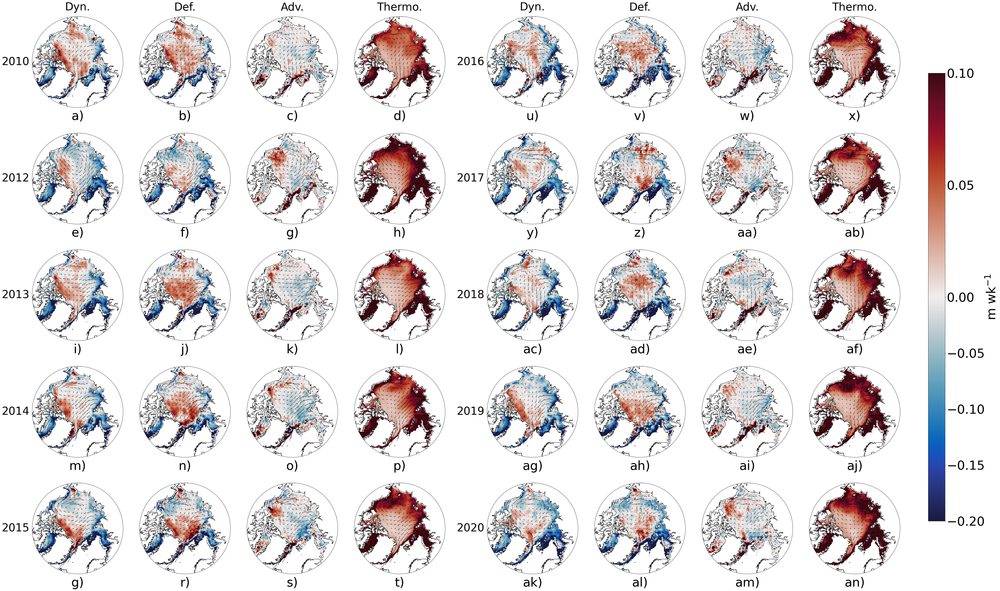

In [15]:
#Figure A1

labels=np.array(['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)','m)','n)','o)','p)','g)','r)','s)',
       't)','u)','v)','w)','x)','y)','z)','aa)','ab)','ac)','ad)','ae)','af)','ag)','ah)','ai)','aj)','ak)','al)',
       'am)','an)']).reshape(10,4)

fn=glob.glob(deffp + 'thmdyn2*')

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(5,9, subplot_kw={'projection': proj},gridspec_kw={'width_ratios': [1, 1, 1, 1, 0.1, 1, 1, 1, 1]})
for i in range(0,5):
    ax[i,4].outline_patch.set_visible(False)
ax=np.vstack((ax[:,0:4],ax[:,5:9]))
f.set_figheight(40)
f.set_figwidth(60)

for i in range(0,len(fn)):
    thmdyn=xr.open_dataset(fn[i]).where((alltime.rmask>=6) & (alltime.rmask<=15))
    yr=str(thmdyn.time[0].dt.year.values)
    
    ax[i,0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,0].set_boundary(circle, transform=ax[i,0].transAxes)
    ax[i,0].coastlines()
    ax[i,0].text(0.5, -0.1, labels[i,0], transform=ax[i,0].transAxes, va='center', ha='center')

    d=ax[i,0].pcolormesh(thmdyn.y, thmdyn.x, thmdyn.dyn.mean('time'),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    
    ax[i,1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,1].set_boundary(circle, transform=ax[i,1].transAxes)
    ax[i,1].coastlines()
    ax[i,1].text(0.5, -0.1, labels[i,1], transform=ax[i,1].transAxes, va='center', ha='center')

    d=ax[i,1].pcolormesh(thmdyn.y, thmdyn.x, thmdyn.dfm.mean('time').where(alltime.rmask!=14),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))    
    
    ax[i,2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,2].set_boundary(circle, transform=ax[i,2].transAxes)
    ax[i,2].coastlines()
    ax[i,2].text(0.5, -0.1, labels[i,2], transform=ax[i,2].transAxes, va='center', ha='center')

    d=ax[i,2].pcolormesh(thmdyn.y, thmdyn.x, thmdyn.adv.mean('time').where(alltime.rmask!=14),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    
    ax[i,3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,3].set_boundary(circle, transform=ax[i,3].transAxes)
    ax[i,3].coastlines()
    ax[i,3].text(0.5, -0.1, labels[i,3], transform=ax[i,3].transAxes, va='center', ha='center')

    d=ax[i,3].pcolormesh(thmdyn.y, thmdyn.x, thmdyn.thm.mean('time'),cmap=cmo.balance,norm=TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.1))
    
    for j in [1,2,3,0]:

        Q=ax[i,j].quiver(thmdyn.x.values[::10], thmdyn.y.values[::10], thmdyn.u.mean('time').where(thmdyn.u.mean('time')!=0).values[::10,::10], thmdyn.v.mean('time').where(thmdyn.v.mean('time')!=0).values[::10,::10],scale=100)

ax[0,0].quiverkey(Q, 0.2, 11.3, 5.79, '5\nkm d$^{-1}$')
    
cbar_ax = f.add_axes([0.925, 0.2, 0.015, 0.6])
cb=f.colorbar(c, cax=cbar_ax, label='m wk$^{-1}$', ticks=[-0.2, -0.15, -0.1, -0.05, 0, 0.05, 0.1])


ax[0,0].text(0.5, 1.1, 'Dyn.', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=42)
ax[0,1].text(0.5, 1.1, 'Def.', transform=ax[0,1].transAxes, va='center', ha='center', fontsize=42)
ax[0,2].text(0.5, 1.1, 'Adv.', transform=ax[0,2].transAxes, va='center', ha='center', fontsize=42)
ax[0,3].text(0.5, 1.1, 'Thermo.', transform=ax[0,3].transAxes, va='center', ha='center', fontsize=42)
ax[5,0].text(0.5, 1.1, 'Dyn.', transform=ax[5,0].transAxes, va='center', ha='center', fontsize=42)
ax[5,1].text(0.5, 1.1, 'Def.', transform=ax[5,1].transAxes, va='center', ha='center', fontsize=42)
ax[5,2].text(0.5, 1.1, 'Adv.', transform=ax[5,2].transAxes, va='center', ha='center', fontsize=42)
ax[5,3].text(0.5, 1.1, 'Thermo.', transform=ax[5,3].transAxes, va='center', ha='center', fontsize=42)

ax[0,0].text(-0.18, 0.5, '2010', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=42)
ax[1,0].text(-0.18, 0.5, '2012', transform=ax[1,0].transAxes, va='center', ha='center', fontsize=42)
ax[2,0].text(-0.18, 0.5, '2013', transform=ax[2,0].transAxes, va='center', ha='center', fontsize=42)
ax[3,0].text(-0.18, 0.5, '2014', transform=ax[3,0].transAxes, va='center', ha='center', fontsize=42)
ax[4,0].text(-0.18, 0.5, '2015', transform=ax[4,0].transAxes, va='center', ha='center', fontsize=42)
ax[5,0].text(-0.18, 0.5, '2016', transform=ax[5,0].transAxes, va='center', ha='center', fontsize=42)
ax[6,0].text(-0.18, 0.5, '2017', transform=ax[6,0].transAxes, va='center', ha='center', fontsize=42)
ax[7,0].text(-0.18, 0.5, '2018', transform=ax[7,0].transAxes, va='center', ha='center', fontsize=42)
ax[8,0].text(-0.18, 0.5, '2019', transform=ax[8,0].transAxes, va='center', ha='center', fontsize=42)
ax[9,0].text(-0.18, 0.5, '2020', transform=ax[9,0].transAxes, va='center', ha='center', fontsize=42)

# plt.show()

plt.savefig(outfp + 'def_yearly.png', bbox_inches="tight")